# LES first look

In [2]:
%load_ext watermark
%load_ext snakeviz
%matplotlib inline

import glob
import os

import cf_xarray as cfxr
import dcpy
import distributed
import flox.xarray
import hvplot.xarray
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from IPython.display import Image

import pump

xr.set_options(keep_attrs=True)
mpl.rcParams["figure.dpi"] = 140

%watermark -iv

cf_xarray  : 0.7.0
flox       : 0.4.1.dev11+gd895625.d20220401
xarray     : 2022.3.0
hvplot     : 0.7.3
pump       : 0.1
distributed: 2022.3.0
dcpy       : 0.2.1.dev4+g05012cc.d20220325
numpy      : 1.21.5
matplotlib : 3.5.1



In [102]:
# horizontally averaged file
ds = pump.les.read_les_file(
    "../datasets/les/ROMS_PSH_6HRLIN_0N140W_360x360x216_22OCT2020.nc"
)
ds["-tempw"] = -ds.tempw
ds

<xarray.Dataset>
Dimensions:       (z: 216, time: 8774)
Coordinates:
  * z             (z) float64 -107.5 -107.0 -106.5 -106.0 ... -1.5 -1.0 -0.5 0.0
  * time          (time) datetime64[ns] 1985-10-02T06:00:00 ... 1985-11-05T20...
    dz            float64 0.5
Data variables: (12/71)
    ume           (time, z) float32 0.8649 0.8554 0.8459 ... -0.003125 nan
    vme           (time, z) float32 -0.001973 -0.002123 -0.002411 ... 0.2865 nan
    tempme        (time, z) float32 22.31 22.38 22.45 22.52 ... 25.2 25.19 nan
    saltme        (time, z) float32 35.28 35.29 35.29 35.29 ... 35.06 35.06 nan
    urms          (time, z) float32 0.0001859 0.0001762 ... 0.01327 nan
    vrms          (time, z) float32 0.000186 0.0001766 ... 0.008917 nan
    ...            ...
    chi           (time, z) float32 1.062e-08 -6.989e-10 ... -2.423e-07 nan
    tke           (time, z) float32 4.914e-08 4.067e-08 ... 0.0001316 nan
    Rif           (time, z) float64 nan nan nan nan nan ... nan nan nan nan nan
    Reb           (time, z) float32 nan 8.843 9.495 9.885 ... nan nan nan nan
    Jq            (time, z) float64 -11.26 0.6191 0.5909 ... -12.06 -79.09 nan
    -tempw        (time, z) float32 -0.0 -0.0 0.0 ... -9.101e-06 -5.776e-06 nan
Attributes:
    type:     DIABLO LES, processed means
    title:    ROMS_PSH_6HRLIN_0N140W_360x360x216_22OCT2020

## $Re_b$ and $Ri_f$

### Definitions

\begin{align*}
    b_z & =  gα T_z +gβ S_z\\ 
    (B = ) F_b &= k b_z - wb \\
    Re_b &= \frac{ε}{ν N^2} \\
    Ri_f &= \frac{F_b}{F_b + ε}  
\end{align*}

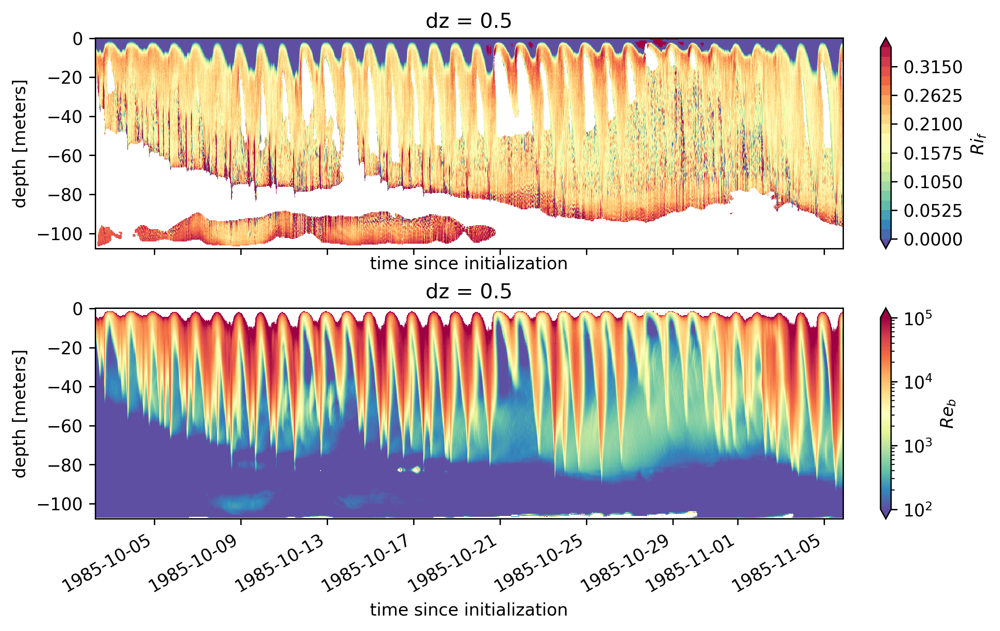

In [102]:
f, ax = plt.subplots(2, 1, sharex=True, sharey=True, constrained_layout=True)
ds.Rif.cf.plot(vmin=0, vmax=0.35, ax=ax[0], levels=21, cmap=mpl.cm.Spectral_r)
ds.Reb.cf.plot(ax=ax[1], norm=mpl.colors.LogNorm(1e2, 1e5), cmap=mpl.cm.Spectral_r)
f.set_size_inches((8, 5))

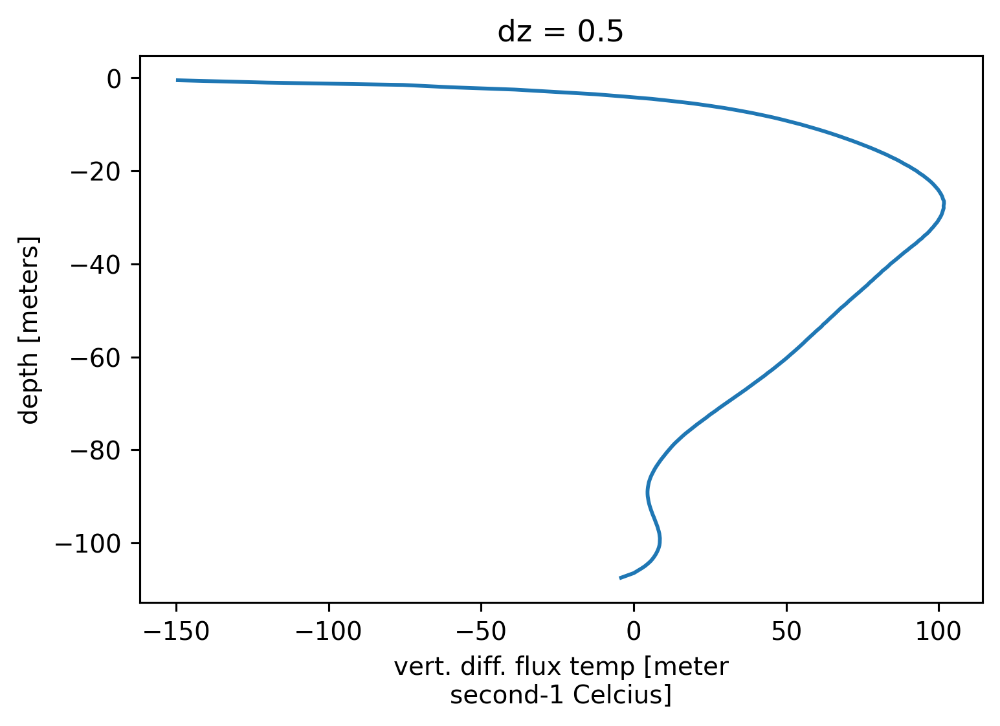

In [105]:
(1025 *  4200 * ds.KT * ds.dTdz).mean("time").cf.plot()

### Dan's comments

The plot shows that the LES simulates rather high $Ri_f \sim 0.2$. Some thoughts:

The methods for inferring $Ri_f$ and $Re_b$ are different in observations and LES and neither are perfect.
1. Observations are of small-scale variance of T and S, which are used to estimate χ, ε. Then, temperature, salinity, and buoyancy fluxes are estimated using flux gradient relations. Conversely, LES directly simulates the dominant energy containing scales of the turbulence, and of the temperature and salinity and hence buoyancy fluxes, but LES uses ~1-meter scale  gradients in shear/T to parameterize dissipation scales. So, you can see how $Ri_f$ varies dynamically in LES (e.g. how it varies with $Re_b$ and $Ri_g$, surface forcing, S2, N2, etc.) and compare with observations. 

1. But, it is not clear that you can use LES or observations to resolve questions about uncertainties associated with the methodologies of each, with the possible exception of some aspects of the sampling uncertainties. You can directly address other questions about methodological uncertainties with flux tower observations or DNS. On the other hand, both of these tools have limitations. The DNS resolves dissipation scales but the box is too small (due to <cm scale grid cells) to fully resolve the TKE and fluxes, while flux towers only work in shallow water or in the lower atmospheric boundary layer and may not be able to sample the parameter space relevant for turbulence in the open ocean thermocline.


I do think practical progress might be made via at least 2 and maybe 3 angles:
1. quantify variability of $Ri_f$ in the LES as well as observations
2. examine possible causes of variability in $Ri_f$ in observations and LES. 
    1. Are there similarities in these spatio-temporal patterns or parameter dependencies (e.g. relatively invariant Rif with Reb?)? 
    1. Could there be an explanation due to difference in parameter space? I would like to be able to predict for subgrid parameterization in LES (and in ocean models), how Rif varies with Rig or Reb at 1 m. It seems Reb is not very useful, but maybe Rig is? Either way, modelling Rif is very important.
3. I’m even less certain about this third angle, but perhaps the virtual mooring data from LES can be used to examine the consequences of spatial or ensemble averaging on the observational estimate (and you can do some similar assessment of averaging sensitivity in observations)?
   1. In LES, you have subridscale viscosity and diffusivity at each model level and state variables ($U,V,W,T,S$), which you could use to estimate parameterized dissipation proportional to $ν_{sgs} u_z^2$ and $κ_{sgs} T_z^2$ with coefficient assuming isotropy and compare with the laterally averaged statistics.
   1. Conversely, you could explore sensitivity to your sequence of averaging/analysis in observations, e.g. first average ε, χ, $N^2$, $T_z$, over various numbers of profiles, then run through $Ri_f$ calculations.


One of the potential problems with LES is that the subgrid-scale viscosity varies in space and time to try to mimic the subgrid dynamics of high-reynolds number flow. However, the subgrid-scale (sgs) dynamic viscosity model in the LES may be ineffective at achieving its goal.

1. To the extent the sgs model fails, LES might be more like a DNS at low Reynolds number, as if we just set the subgrid-scale viscosity to a constant high value that is much greater than molecular viscosity of seawater, rather than varying it dynamically.

1. To get a sense for how this might bias the results, I looked at $ν_{sgs}$ in the LES “mooring” data and see it peaks at about 10^(-3) m^2/s and is frequently greater than 10^(-4) in strong turbulence. So, I tried substituting 1e-6 with 1e-3 or 7e-4 in the denominator of $Re_b$. In this case, $Re_b$ ~1-100 in strong turbulence (rather than 10^2-10^5).

1. Perhaps this could explain the factor of 2 difference between LES and observations? But your observations suggest that it probably cannot explain all of the difference between LES and observations since observational estimate of $Ri_f$ is almost constant (and never as large as 0.2) from $Re_b$=1 to 10^5.
 
1. Bottom line is that it might be useful to look more closely at $ν_{sgs}$ from the mooring data to the LES statistics file and using that to calculate Reb. How exactly to make sense of this is not clear to me though.


## Understanding LES

### Heat Flux

Total "(horizontally-averaged) downward turbulent temperature flux"
\begin{equation}
F_T = \overline{κ_{sgs}T_z} - \overline{wT}
\end{equation}

$-\overline{wT}$ is much larger than the sgs diffusive flux $\overline{κ_{sgs}T_z}$

Dan:
1. $F_T$ is what I would compare to the typical observational estimate of turbulent heat flux from chipod e.g. “Jq” or turbulent heat flux in an ocean model mixing parameterization (e.g. from KPP). If you want to compare to turbulent diffusivity derived from observations, I would calculate $F_T/<dT/dz>$ <> is the horizontal avg. Both are saved.

1. $F_T$ is saved as two terms mainly for model-diagnostic purposes (the first term is “parameterized” and the second is “resolved”).

    - One reason to separate them for scientific purposes is if you want to examine the different wavelengths contributing to the turbulent flux, i.e. cospectrum of T and w in LES. Generally, the second term “tempw,” which represents the flux integrated across wavelengths from about 2 m to 306 m should be dominant, and the first term kappadtdz represents turbulent flux by unresolved eddies with wavelengths < 2 m plus even smaller molecular diffusion.
    - We have also the co-spectrum tempw(k) saved to separate contributions of all scales across the 2 m to 306 m range.
    - The first term is written as $κT_z$ to indicate that in the LES this parameterized subgrid-scale flux is represented as a down-gradient diffusive temperature transport (which cannot be further separated by scale). This diffusive term includes both molecular diffusion Km<dT/dz> plus unresolved subgrid-scale (SGS) turbulent vertical transport, which is: <K_{SGS} dT/dz> and represents vertical transport by turbulent eddies with scales smaller than ~2 m (that are not resolved on the LES mesh) as down-gradient diffusion. Unlike molecular diffusivity Km, K_{SGS} varies by orders of magnitude in space and time depending on the grid-scale shear and stratification.
1. Importantly, I do *not* think $<\kappa_{SGS}>$ should be compared directly to turbulent diffusivity of temperature estimated in the standard way from a chipod, since this diffusivity estimated by chipod usually represents the diffusivity associated with the entire turbulent temperature flux $F_T$, not just the turbulent flux associated with particular small wavelengths (e.g., < 2 m). Maybe there is some reason to make this comparison, but I’m not sure why.
1. $κ_{SGS}$ and kappadtdz = <kappa_{SGS} dT/dz> both depend on the LES mesh spacing and are therefore an artefact of the particular modelling choices. Both would converge to the very small molecular values <Km> and <Km><dT/dz> as grid spacing converges to ~Batchelor scale.
    - On the other hand, $F_T$ should be approximately constant as LES grid spacing is refined, <dT/dz> should be independent of mesh refinement too,
    - and turbulent temperature diffusivity $K_T=F_T/<dT/dz>$  should also be independent of LES mesh refinement *(similar to standard diffusivity from chipod, which does not depend on what scales you are taking into account)*. You have something similar for momentum.


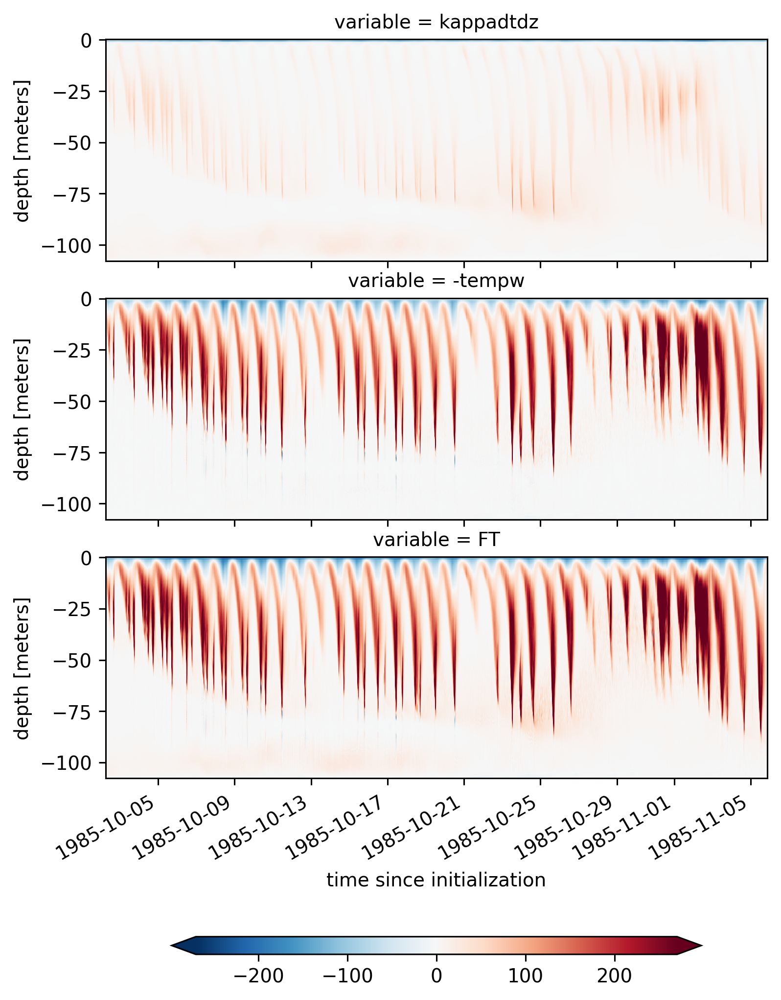

In [22]:
(1025 * 4200 * ds[["kappadtdz", "-tempw", "FT"]]).to_array("variable").cf.plot(
    row="variable",
    robust=True,
    cbar_kwargs={"orientation": "horizontal", "shrink": 0.8, "aspect": 30},
    aspect=1.6,
)

I thought that
\begin{equation}
  -\widetilde{wT} = \widetilde{κ_{sgs}  T_z}
\end{equation}
for some averaging timescale $\widetilde{\phantom{asd}}$  greater than the $\overline{\phantom{asd}}$ timescale in `tempw`. But this is again wrong.

Which makes sense because then $F_T=0$ and the eddies are damped.

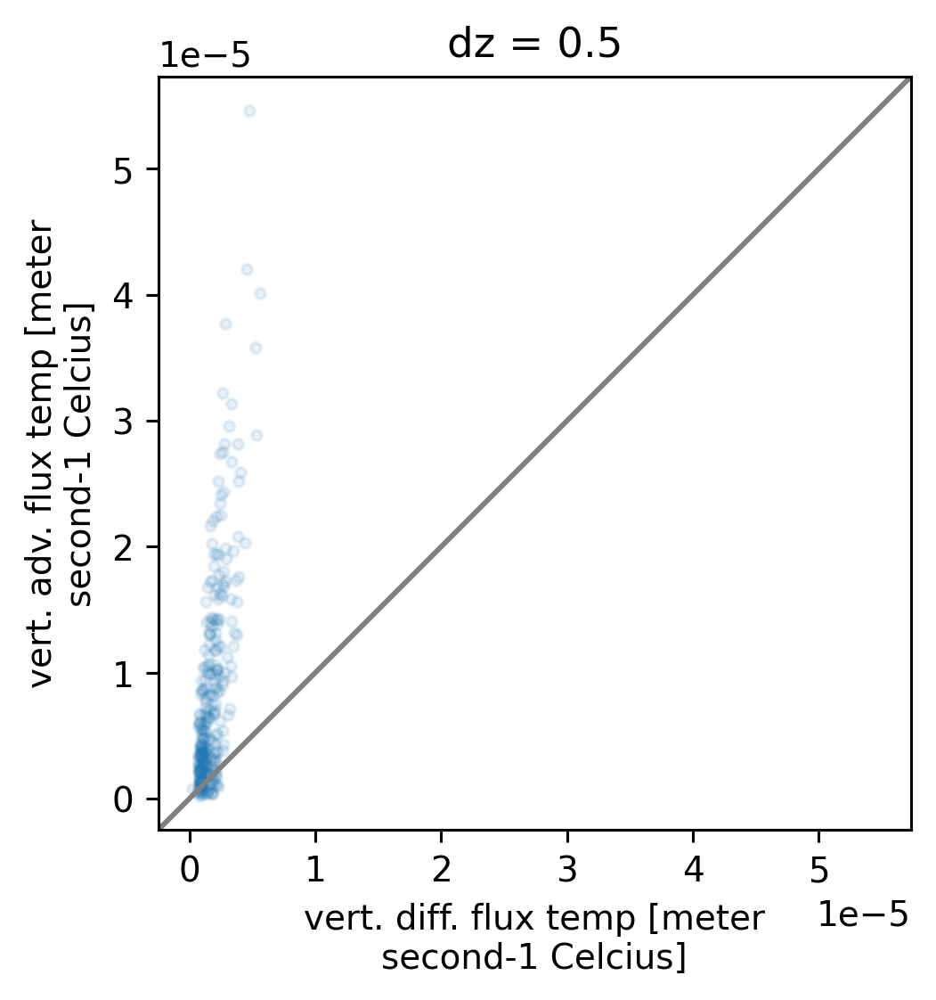

In [104]:
(
    ds[["kappadtdz", "-tempw"]]
    .mean("z")
    .resample(time="3H")
    .mean()
    .plot.scatter(x="kappadtdz", y="-tempw", marker=".", alpha=0.1)
)
dcpy.plots.line45()

### χ

If I define $χ_{sgs} = \overline{κ_{sgs}T_z} \overline{T}_z$ or $χ_{FT}=\overline{F_T}/\overline{T}_z$, it will  be quite different. Dan uses the second definition for $K_T$ so let's use that.

Hmmm... there are many negative diffusivities $K_T$ but $χ_{sgs}$ is mostly positive. 
- I guess $χ_{sgs}$ is negative because there are times when the sign of $\overline{T}_z$ is negative and anticorrelated to $\overline{T_z}$ (average of gradients)?

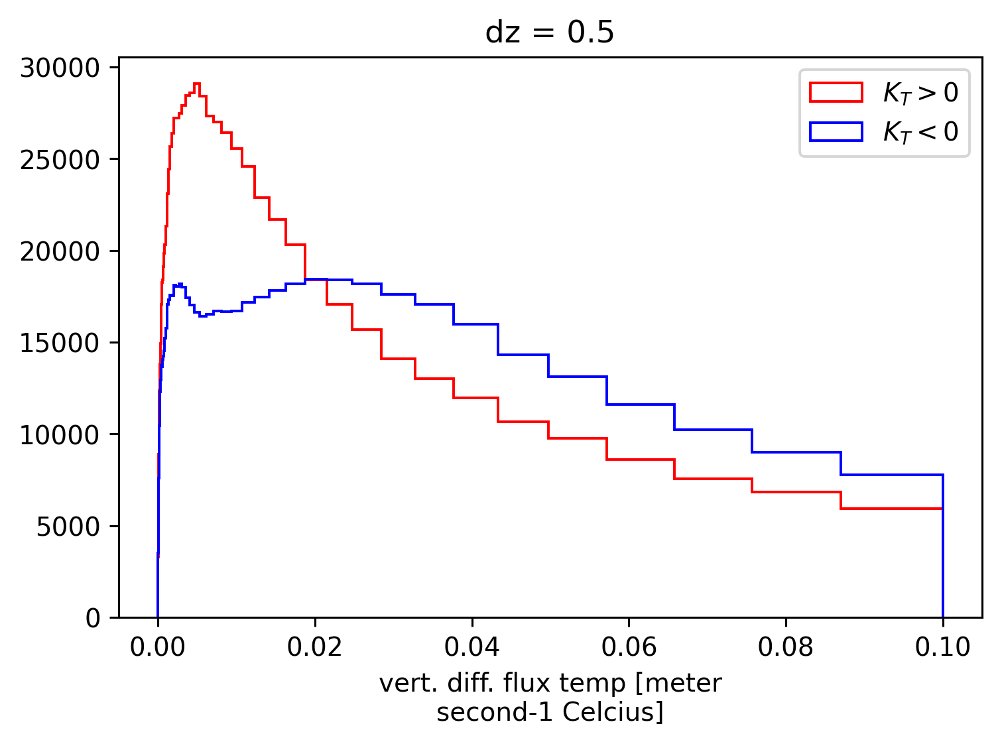

In [106]:
kwargs = dict(bins=np.logspace(-7, -1, 100), histtype="step")
ds.KT.where(ds.KT > 0).plot.hist(**kwargs, color='red')
(-1 * ds.KT.where(ds.KT < 0)).plot.hist(**kwargs, color='blue');
plt.legend(["$K_T > 0$", "$K_T < 0$"])

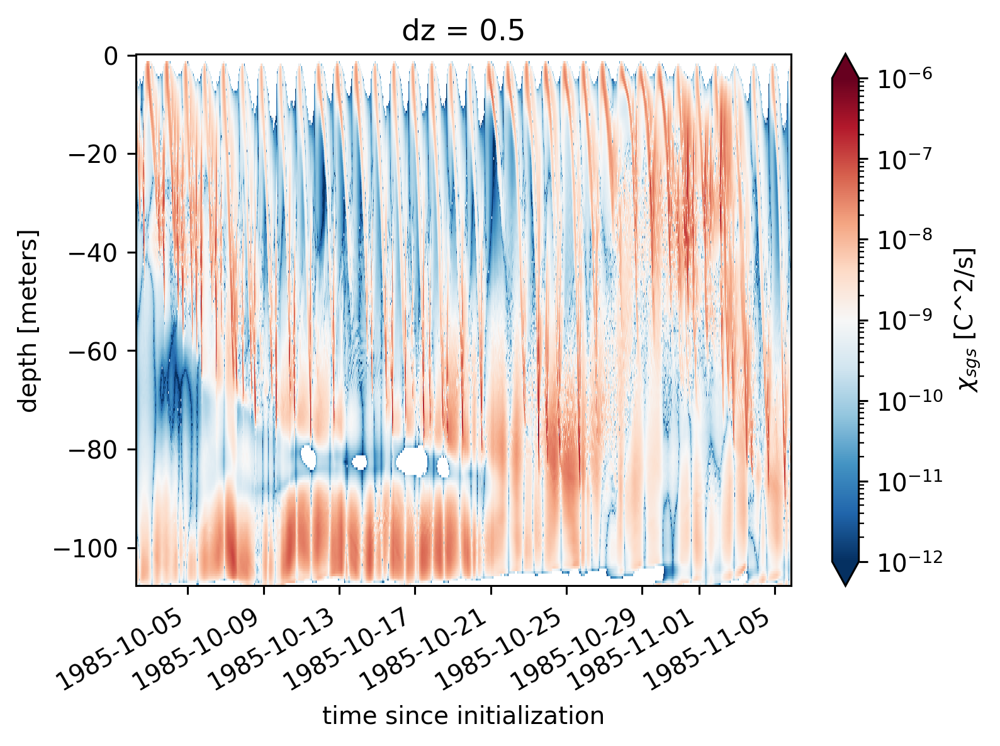

In [75]:
ds["chi_sgs"] = (ds.kappadtdz * np.abs(ds.dTdz))
ds["chi_sgs"].attrs = {"long_name": "$χ_{sgs}$", "units": "C^2/s"}
ds.chi_sgs.cf.plot(robust=True, norm=mpl.colors.LogNorm(1e-12, 1e-6))


Dan:
- a horizontal-avg temperature variance budget includes tendency, production, vertical transport, dissipation. Here is how it looks in LES with variable kappa_{SGS}:
\begin{equation}
∂_t <T’^2/2> + <w’T’><dT/dz> + ∂_z(<w’T’T’/2> - <T’KdT/dz>) = - <K><(dT’/dz)^2 – <K’ dT’/dz>d<T>/dz - <K’(dT’/dz)^2>
\end{equation} 
    and dissipation includes 6 more analogous terms (3 for each x and y dimensions, just replacing z with x or y) to represent dissipation of temperature variance due to horizontal mixing.
- You can calculate the production term directly from the horizontally averaged statistics tempw and mean T profile: `ROMS_PSH_6HRLIN_0N140W_360x360x216_22OCT2020.nc`
- The tendency could be estimated by temporal finite difference of <T’^2> = temprms^2 at two different time points.
But I do not think vertical transport or dissipation of temperature variance are easy to estimate.

 
On the other hand, you can estimate chi from the instantaneous virtual mooring output (a single LES column) in which kappa_sgs and nu_sgs are saved: `ROMS_PSH_6HRLIN_0N140W_360x360x216_22OCT2020_mooring.nc`

1. Using a formula like $C * κ_{sgs} * T^2_z$. You need to vertically finite difference T to get the instantaneous vertical gradient at 1 m scale.
and you need to scale up the product by some scaling factor “C” e.g. assuming isotropy of gradient at 1 m scales, possibly dealing with a factor of two depending on your preferred convention for how to define chi.

1. We also have 3-D and 2-D snapshots of T, and we have 2-D snapshots (depth-horizontal) of nu_sgs and kappa_sgs, so you can statistically quantify grad(T) anisotropy and more accurately estimate dissipation at 1-m scale to define C more precisely if you want.
    - `/glade/p/cgd/oce/people/dwhitt/TPOS/les_output/ROMS_PSH_6HRLIN_0N140W_360x360x216_22OCT2020_***`
    - Where *** are numbers from 1-477. Look for 2-D snapshots in movie.h5 (2-D) and 3-D snapshots in out.*****.h5 (3-D).
    - Note strange notation in these LES out files Y and V (in LES) correspond vertical (Z and W in physical world),
    - And W and Z correspond to meridional/north (V and Y in physical world).

### Buoyancy flux

Estimated using χ, and using $F_b$

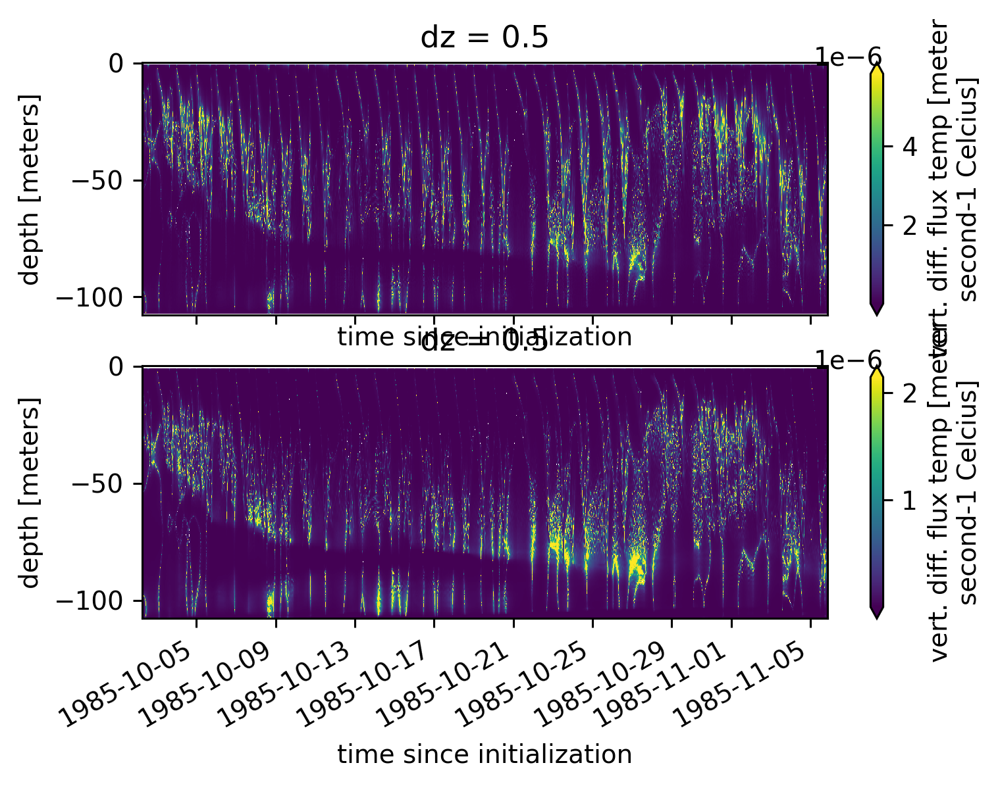

In [72]:
ds["B"] = ds.chi / 2 * ds.N2 / ds.dTdz**2
B = chi / 2 * ds.N2 / ds.dTdz**2

f, ax = plt.subplots(2, 1, sharex=True, sharey=True)
np.abs(ds.B).cf.plot(robust=True, ax=ax[0])
B.cf.plot(robust=True, ax=ax[1])

## Mooring LES

In [10]:
# horizontally averaged file
moor = xr.load_dataset(
    "../datasets/les/ROMS_PSH_6HRLIN_0N140W_360x360x216_22OCT2020_mooring.nc"
).isel(z=slice(-1))
moor

<xarray.Dataset>
Dimensions:    (z: 215, time: 15342)
Coordinates:
  * z          (z) float64 -107.5 -107.0 -106.5 -106.0 ... -2.0 -1.5 -1.0 -0.5
  * time       (time) datetime64[ns] 1985-10-02T06:01:13.845228446 ... 1985-1...
Data variables:
    u          (time, z) float32 0.8652 0.8556 0.846 ... 0.01073 -0.01059
    v          (time, z) float32 -0.001758 -0.00205 -0.002221 ... 0.2802 0.2854
    w          (time, z) float32 3.627e-05 2.813e-05 ... 0.002268 0.0006954
    temp       (time, z) float32 22.31 22.38 22.45 22.52 ... 25.2 25.2 25.19
    salt       (time, z) float32 35.28 35.29 35.29 35.29 ... 35.06 35.06 35.06
    nu_sgs     (time, z) float32 0.0 4.207e-06 7.711e-06 ... 0.0003634 0.0004035
    kappa_sgs  (time, z) float32 0.0 1.969e-06 3.722e-06 ... 0.0003596 0.0004035
    alpha      float64 0.0002976
    beta       float64 -0.0007386
    T0         float64 25.0
    S0         float64 35.25
    rho0       float64 1.024e+03
Attributes:
    type:     DIABLO LES, processed virtual mooring
    title:    ROMS_PSH_6HRLIN_0N140W_360x360x21_22OCT2020_mooring

In [50]:
moor.coords["dz"] = 0.5
moor["z"] = moor.z.copy(data=np.abs(moor.z.data))

moor["dTdz"] = -1 * pump.les.derivative(moor.temp)
moor["chi"] = 6 * moor.kappa_sgs * moor.dTdz**2
moor = moor.cf.guess_coord_axis(verbose=True)

In [31]:
equix = xr.load_dataset(os.path.expanduser("~/datasets/microstructure/osu/equix.nc"))
equix.attrs["name"] = "EQUIX"
tiwe = (
    xr.load_dataset(os.path.expanduser("~/datasets/microstructure/osu/tiwe.nc"))
    .drop_vars(["latitude", "longitude"])
    .sel(depth=slice(200))
)
tiwe.attrs["name"] = "TIWE"

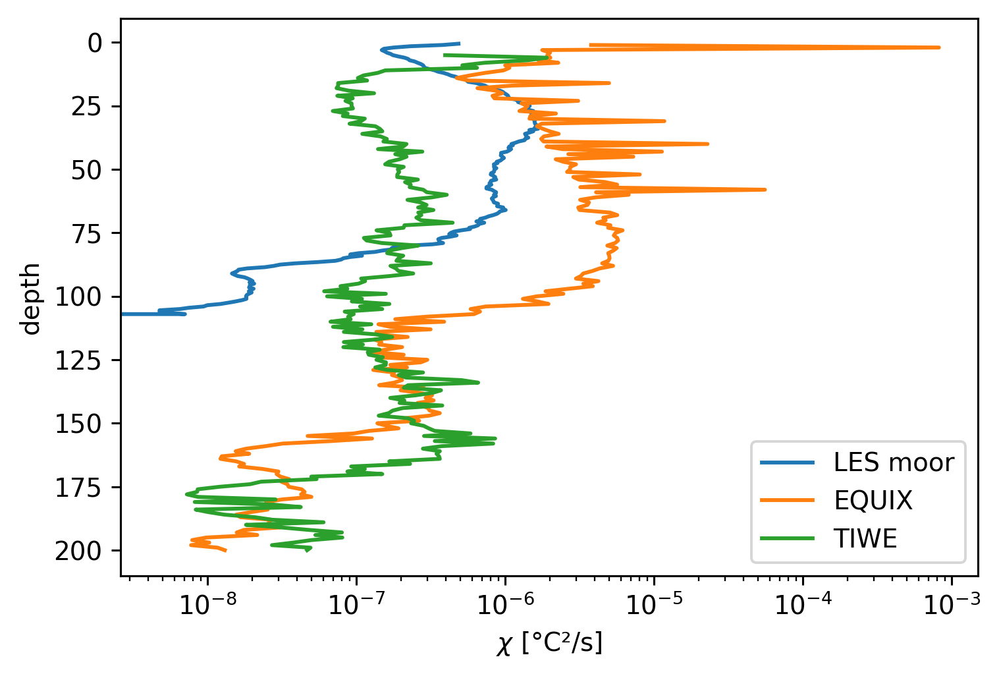

In [55]:
moor.chi.mean("time").cf.plot(xscale="log")
equix.chi.mean("time").cf.plot(xscale="log")
tiwe.chi.mean("time").cf.plot(xscale="log")
plt.legend(["LES moor", "EQUIX", "TIWE"])